In [ ]:
%%capture
%load_ext autoreload
%autoreload 2
import itertools as itt
import os
import sys

import dask as da
import dask.array as darr
import holoviews as hv
import numpy as np
import xarray as xr
from dask.distributed import Client, LocalCluster
from holoviews.operation.datashader import datashade, regrid
from holoviews.util import Dynamic
from IPython.core.display import display
from bokeh.models import HoverTool
from typing import List, Optional, Tuple, Union

import scipy.io as sio
from scipy.signal import find_peaks
import sparse
import matplotlib.pyplot as plt
import pandas as pd
import colorcet as cc
import param
import panel as pn

### Load Data and Necessary Utilities - Minian Output Folder

In [ ]:
minian_path = "."
dpath = r"C:\Miniscope_recordings\Restraint_KET\HAH_NAB\KET_restraint\Fully_Ball\customEntValHere\2024_05_21\14_34_26\My_V4_Miniscope\minian" #either the path to minian folder or to the .nc file is fine
mat_path = r"C:\Miniscope_recordings\Restraint_KET\HAH_NAB\KET_restraint\Fully_Ball\customEntValHere\2024_05_21\14_34_26\My_V4_Miniscope\minian5602_S6_HAH.mat" #mat file to get YrA data

minian_ds_path = os.path.join(dpath, "minian")
intpath = "./minian_intermediate"
interactive = True
output_size = 100
n_workers = int(os.getenv("MINIAN_NWORKERS", 2))

In [ ]:
param_load_videos = {
    "pattern": ".avi$",
    "dtype": np.uint8,
    "downsample": dict(frame=1, height=1, width=1),
    "downsample_strategy": "subset",
}
param_save_minian = {
    "dpath": minian_ds_path,
    "overwrite": True,
}

In [ ]:
%%capture
sys.path.append(minian_path)
from minian.cnmf import (
    adj_corr,
    label_connected
)
from minian.utilities import (
    TaskAnnotation,
    get_optimal_chk,
    load_videos,
    open_minian,
    save_minian,
)
from minian.visualization import(
    visualize_seeds
)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
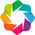

In [ ]:
dpath = os.path.abspath(dpath)
hv.notebook_extension("bokeh", width=100)

In [ ]:
cluster = LocalCluster(
    n_workers=15, #mutiply this number by the memory limit; this intial value should be adjusted to be as close to RAM available. pls check your computer settings
    memory_limit="2GB", #keep this number as low as possible; 2 is the lowest; increase this number if you crash
    resources={"MEM": 1},
    threads_per_worker=2,
    dashboard_address=":8787",
)
annt_plugin = TaskAnnotation()
cluster.scheduler.add_plugin(annt_plugin)
client = Client(cluster)

In [ ]:
ds = open_minian(dpath, post_process=None, return_dict=False)
mat = sio.loadmat(mat_path)

In [ ]:
ds['unit_id'] = range(0, len(ds['A']))

In [ ]:
ds['A']["unit_id"] = range(0, len(ds['A'])) #need to reset the index values bc minian output is not always updated/ in order
ds['C']["unit_id"] = range(0, len(ds['A']))
ds['S']["unit_id"] = range(0, len(ds['A']))

In [ ]:
YrA = mat["YrA"]
sig = mat["sig"]
YrA = xr.DataArray(YrA, dims = ['unit_id', 'frame'], coords=dict(
            unit_id=np.arange(YrA.shape[0]), frame= np.arange(YrA.shape[1])))
sig = xr.DataArray(sig, dims = ['unit_id', 'frame'], coords=dict(
            unit_id=np.arange(sig.shape[0]), frame= np.arange(sig.shape[1])))
#load YrA and other variables as xr.arrays
A = ds["A"]
C = ds["C"]
S = ds["S"]

In [ ]:
len(A), len(YrA) #check that the unit_id information matches up in case of mix up/ mislabeled files

(31, 31)

## Define functions

In [ ]:
def get_candidates(A: xr.DataArray #retrieves spatial overlap between unit_ids
):
    print("computing spatial overlap")
    with da.config.set(
        array_optimize=darr.optimization.optimize,
        **{"optimization.fuse.subgraphs": False}
    ):
        A_sps = (A.data.map_blocks(sparse.COO) > 0).rechunk(-1).persist()
        A_inter = darr.tensordot(  #tensor dot product between all unit_ids
                A_sps.astype(np.float32),
                A_sps.astype(np.float32),
                axes=[(1, 2), (1, 2)], #collapse the height and width dimensions, leaving a unit_id x unit_id matrix, diagonal is each unit_id cast onto itself
            ).compute()
    return A_inter

def get_centroid(data): #function calculating the centroid of a footprint
    y, x = np.where(data > 0)
    if len(x) == 0 or len(y) == 0:
        return None, None
    return int(np.mean(x)), int(np.mean(y))

def normalize_trace(trace): #normalizes each calcium trace
    min_val = np.min(trace)
    max_val = np.max(trace)
    if max_val - min_val == 0:
        return trace  #avoid division by zero
    return (trace - min_val) / (max_val - min_val)

def plot_temporal_traces(group_id): #plots the traces for each group of candidates and returns the correlation values
    selected_group = groups[group_id]
    temporal_traces = []
    correlation_values = []
    cycles = np.arange(len(selected_group))

    for cycle in cycles:#cycle through each unit_id in a group as a reference for the correlation
        correlation_values.append(corr[indices[group_id]+ cycle])

    correlation_values = np.array_split(correlation_values, len(selected_group))


    for ind, unit_id in enumerate(selected_group):
        unit_index = int(unit_id)

        #normalize the trace
        trace_values = C_cand.sel(unit_id=unit_index)
        normalized_trace = normalize_trace(trace_values)

        trace_normalized = hv.Curve((C_cand['frame'], normalized_trace), 'Frame', 'Normalized Intensity').opts(
            title=f'Unit {unit_index}',
            color=colors[group_id],
            width=400,
            height=200,
            tools=['hover']
        )

        trace = hv.Curve((C_cand['frame'], trace_values), 'Frame', 'Total Intensity').opts(
            title=f'Unit {unit_index}',
            color=colors[group_id],
            width=400,
            height=200,
            tools=['hover']
        )

        temporal_traces.append(trace_normalized)
        temporal_traces.append(trace) #append the non-normalized traces and plot as a reference for total fluoresence intensity

    traces_layout = hv.Layout(temporal_traces).cols(2) #set this to two columns
    print(f"Unit: {selected_group}, Correlation: {correlation_values}")
    return traces_layout

def merge_units( A: xr.DataArray,
    C: xr.DataArray,
    add_list: Optional[List[xr.DataArray]] = None): #add_list can be used for additional variables that need to be merged (ex. S, YrA, etc.)
        print("labeling units to be merged")
        adj = np.zeros_like(temporal_correlation.todense(), dtype=bool)
        for pair in merge_list:
            adj[pair[1], pair[0]] = True
        adj = adj + adj.T
        unit_labels = xr.apply_ufunc(
            label_connected,
            adj,
            input_core_dims=[["unit_id", "unit_id_cp"]],
            output_core_dims=[["unit_id"]],
        )
        print("merging units")
        A_merge = (
            A.assign_coords(unit_labels=("unit_id", unit_labels))
            .groupby("unit_labels")
            .mean("unit_id")
            .rename(unit_labels="unit_id")
        )
        C_merge = (
            C.assign_coords(unit_labels=("unit_id", unit_labels))
            .groupby("unit_labels")
            .mean("unit_id")
            .rename(unit_labels="unit_id")
        )
        if add_list:
            for ivar, var in enumerate(add_list):
                var_mrg = (
                    var.assign_coords(unit_labels=("unit_id", unit_labels))
                    .groupby("unit_labels")
                    .mean("unit_id")
                    .rename(unit_labels="unit_id")
                )
                add_list[ivar] = var_mrg
            return A_merge, C_merge, add_list
        else:
            return A_merge, C_merge #returns new matrices with the merged units

def drop_units(A_merged, C_merged, S_merged, YrA_merged, sig_merged, drop_list):
    A_merged = A_merged.drop_sel(unit_id=drop_list)
    C_merged = C_merged.drop_sel(unit_id=drop_list)
    S_merged = S_merged.drop_sel(unit_id=drop_list)
    YrA_merged = YrA_merged.drop_sel(unit_id=drop_list)
    sig_merged = sig_merged.drop_sel(unit_id=drop_list)
    return A_merged, C_merged, S_merged, YrA_merged, sig_merged

def reset_units(A_merged, C_merged, S_merged, YrA_merged, sig_merged): #resets the unit_id labels
    unit_length = len(A_merged)
    A_merged['unit_id'] = np.arange(unit_length)
    C_merged['unit_id'] = np.arange(unit_length)
    S_merged['unit_id'] = np.arange(unit_length)
    YrA_merged['unit_id'] = np.arange(unit_length)
    sig_merged['unit_id'] = np.arange(unit_length)
    return A_merged, C_merged, S_merged, YrA_merged, sig_merged

## Compute spatial overlap and create candidate groups

In [ ]:
A_inter_init = get_candidates(A)

computing spatial overlap


In [ ]:
df = pd.DataFrame(A_inter_init.todense())
df #see number of pixel overlap #diagonal shows the same cell (can also indicate total number of pixels)

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,21.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,8.0,340.0,0.0,0.0,19.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,128.0,0.0,0.0,2.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,644.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,19.0,0.0,0.0,72.0,0.0,7.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,2.0,0.0,0.0,49.0,0.0,34.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.0,0.0,0.0,0.0,0.0,7.0,0.0,310.0,147.0,123.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0.0,0.0,0.0,0.0,0.0,0.0,34.0,147.0,295.0,114.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,123.0,114.0,661.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
candidate_ids = []

for i in range(0, len(A_inter_init)):
    if (sum(A_inter_init[i])-A_inter_init[i][i]) > 0: #must substract the value from the diagonal
        candidate_ids.append(i)

candidate_ids;

In [ ]:
A_cand = A[candidate_ids][:][:]
C_cand = C[candidate_ids][:][:]
S_cand = S[candidate_ids][:][:]
A_inter = A_inter_init[candidate_ids]

In [ ]:
A_cand["unit_id"].values

array([ 1,  2,  3,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 16, 17, 18, 20,
       25, 26, 27])

In [ ]:
C_cand['unit_id'].values

array([ 1,  2,  3,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 16, 17, 18, 20,
       25, 26, 27])

In [ ]:
group = np.zeros((len(A_inter), 20)) #column specification may need to be increased depending on the expectation for how many cells will be in a group
group[:][:] = None

for ind, i in enumerate(A_inter):
    a = 0
    for indj, j in enumerate(i):
        if j > 0:
            group[ind][a] = indj
            a = a + 1
group;

In [ ]:
ind, indj #checking that it is looping through the correct dimensions of the matrix

(19, 30)

In [ ]:
group = [row[~np.isnan(row)] for row in group]
group; #dropping nan values

In [ ]:
#drop the groups that are exact duplicates, get unique groups
unique = {tuple(my_list) for my_list in group}
groups = [list(tup) for tup in unique]
groups

[[9.0, 10.0, 17.0, 18.0],
 [1.0, 2.0],
 [7.0, 8.0, 11.0, 12.0],
 [11.0, 12.0, 13.0],
 [17.0, 20.0],
 [26.0, 27.0],
 [5.0, 7.0, 8.0, 9.0, 10.0, 11.0, 13.0],
 [6.0, 7.0, 8.0, 9.0, 10.0, 11.0],
 [14.0, 16.0],
 [2.0, 5.0, 7.0],
 [9.0, 10.0, 17.0, 18.0, 20.0],
 [7.0, 12.0, 13.0],
 [3.0, 6.0],
 [3.0, 6.0, 8.0],
 [1.0, 2.0, 5.0],
 [7.0, 8.0, 9.0, 10.0, 17.0, 18.0],
 [25.0, 26.0, 27.0],
 [25.0, 26.0]]

### Getting temporal correlation values for each group

In [ ]:
nod_df = pd.DataFrame({"unit_id": A["unit_id"].values})

temporal_correlation = adj_corr(C, A_inter_init, nod_df, freq=None)

pixel recompute ratio: 1.0
computing correlations


In [ ]:
dfT = pd.DataFrame(temporal_correlation.todense())
dfT = np.round(dfT, 2) #round to two decimal points
dfT

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
0,1.0,0.0,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0
1,0.0,1.0,0.68,0.0,0.0,0.00,0.00,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0
2,0.0,0.0,1.00,0.0,0.0,0.53,0.00,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0
3,0.0,0.0,0.00,1.0,0.0,0.00,0.17,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0
4,0.0,0.0,0.00,0.0,1.0,0.00,0.00,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0
5,0.0,0.0,0.00,0.0,0.0,1.00,0.00,-0.09,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0
6,0.0,0.0,0.00,0.0,0.0,0.00,1.00,0.00,0.80,0.00,...,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0
7,0.0,0.0,0.00,0.0,0.0,0.00,0.00,1.00,0.61,0.73,...,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0
8,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.00,1.00,0.37,...,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0
9,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.00,0.00,1.00,...,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0


In [ ]:
corr = np.zeros((1500, 20)) #increase dim length if error arises
corr[:][:] = None
row = 0
indices = [0]

for units, unit_group in enumerate(groups):
    cycles = np.arange(len(unit_group))
    for cycle in cycles:
        ref_unit = unit_group[cycle]  #cycle through units to use as reference
        for indj, j in enumerate(unit_group):
            corr[row][indj] = dfT[j][ref_unit]
        row = row + 1
    indices.append(row)

corr;

In [ ]:
corr = [row[~np.isnan(row)] for row in corr]
corr = [x for x in corr if x != []]
corr #dropped nan

C:\Users\eisch\AppData\Local\Temp\ipykernel_11112\4152855079.py:2: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  corr = [x for x in corr if x != []]
C:\Users\eisch\AppData\Local\Temp\ipykernel_11112\4152855079.py:2: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  corr = [x for x in corr if x != []]


[array([1.  , 0.22, 0.02, 0.3 ]),
 array([0.  , 1.  , 0.27, 0.62]),
 array([0.  , 0.  , 1.  , 0.71]),
 array([0., 0., 0., 1.]),
 array([1.  , 0.68]),
 array([0., 1.]),
 array([1.  , 0.61, 0.16, 0.  ]),
 array([ 0.  ,  1.  , -0.03,  0.  ]),
 array([0.  , 0.  , 1.  , 0.46]),
 array([0., 0., 0., 1.]),
 array([1.  , 0.46, 0.  ]),
 array([0.  , 1.  , 0.67]),
 array([0., 0., 1.]),
 array([1.  , 0.61]),
 array([0., 1.]),
 array([1.  , 0.85]),
 array([0., 1.]),
 array([ 1.  , -0.09,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ]),
 array([0.  , 1.  , 0.61, 0.73, 0.27, 0.16, 0.17]),
 array([ 0.  ,  0.  ,  1.  ,  0.37,  0.38, -0.03,  0.  ]),
 array([0.  , 0.  , 0.  , 1.  , 0.22, 0.  , 0.  ]),
 array([0., 0., 0., 0., 1., 0., 0.]),
 array([0., 0., 0., 0., 0., 1., 0.]),
 array([0., 0., 0., 0., 0., 0., 1.]),
 array([1. , 0. , 0.8, 0. , 0. , 0. ]),
 array([0.  , 1.  , 0.61, 0.73, 0.27, 0.16]),
 array([ 0.  ,  0.  ,  1.  ,  0.37,  0.38, -0.03]),
 array([0.  , 0.  , 0.  , 1.  , 0.22, 0.  ]),
 array([0., 0., 0., 0.

### Binary Spatial Footprints (All, Candidates) and Temporal Traces for Candidate Groups

In [ ]:
num_groups = len(groups)

In [ ]:
#create hover tool for unit_id
hover = HoverTool(
    tooltips=[
        ("Unit ID", "@unit_id"),
    ]
)

#create mapping from unit_id to group
unit_to_group = {}
for group_id, group in enumerate(groups):
    for unit_id in group:
        if unit_id not in unit_to_group:  # Only assign if not already assigned since cells may appear in multiple groups
            unit_to_group[unit_id] = group_id

#assign colors to each group
num_groups = len(groups)
colors = cc.glasbey[:num_groups]

#create points with unit_id information at the centroid for A
all_points = []
for unit_id in A['unit_id'].values:
    footprint = A.sel(unit_id=unit_id)
    x, y = get_centroid(footprint.values)
    if x is not None and y is not None:
        points = hv.Points((x, y, unit_id), kdims=["width", "height"], vdims=["unit_id"]).opts(size=5, tools=[hover])
        all_points.append(points)

points_all = hv.Overlay(all_points)

#create points with unit_id information at the centroid for A_cand
all_points_cand = []
for unit_id in A_cand['unit_id'].values:
    footprint = A_cand.sel(unit_id=unit_id)
    x, y = get_centroid(footprint.values)
    if x is not None and y is not None:
        group_id = unit_to_group.get(unit_id, -1)  # Get group id or -1 if not found
        color = colors[group_id] if group_id != -1 else 'black'
        points = hv.Points((x, y, unit_id), kdims=["width", "height"], vdims=["unit_id"]).opts(size=5, tools=[hover], color = color)
        all_points_cand.append(points)

points_cand = hv.Overlay(all_points_cand)

In [ ]:
#define a param class for selecting groups
class GroupSelector(param.Parameterized):
    group = param.ObjectSelector(default=0, objects=list(range(num_groups)))

    @param.depends('group')
    def view(self):
        selected_group = groups[self.group]
        group_points_cand = []
        for unit_id in selected_group:
            if unit_id in A_cand['unit_id'].values:
                footprint = A_cand.sel(unit_id=unit_id)
                x, y = get_centroid(footprint.values)
                if x is not None and y is not None:
                    points = hv.Points((x, y, unit_id), kdims=["width", "height"], vdims=["unit_id"]).opts(size=5, color=colors[self.group], tools=[hover])
                    group_points_cand.append(points)
        points_overlay = hv.Overlay(group_points_cand)
        return regrid(hv.Image(
            (A_cand.fillna(0) > 0).sum("unit_id").compute().astype(np.uint8).rename("A_cand"),
            kdims=["width", "height"],
        ).opts(**opts)) * points_overlay

#instantiate group selector
group_selector = GroupSelector()

In [ ]:
A['width'] = np.arange(len(A['width']))
A_cand['width'] = np.arange(len(A_cand['width']))
A['height'] = np.arange(len(A['height']))
A_cand['height'] = np.arange(len(A_cand['height'])) #need to reset width and height values if the video is subsetted

In [ ]:
hv.output(size=int(output_size * 1.7))
opts = dict(
    plot=dict(height=A.sizes["height"], width=A.sizes["width"], colorbar = False),
    style=dict(cmap="Viridis"),
)
(
    (regrid(
        hv.Image(
            (A.fillna(0) > 0).sum("unit_id").compute().astype(np.uint8).rename("A"),
            kdims=["width", "height"],
        ).opts(**opts)
    )*points_all).relabel("Binary Spatial Footprints - All")
    + (regrid(
        hv.Image(
            (A_cand.fillna(0) > 0).sum("unit_id").compute().astype(np.uint8).rename("A_cand"),
            kdims=["width", "height"],
        ).opts(**opts)
    )*points_cand).relabel("Binary Spatial Footprints - Candidates")
).cols(2) #can hover over cells to get unit_id info #candidates are displayed by group

:Layout
   .DynamicMap.Binary_Spatial_Footprints_hyphen_minus_All        :DynamicMap   []
      :Overlay
         .Image.I       :Image   [width,height]   (A)
         .Points.I      :Points   [width,height]   (unit_id)
         .Points.II     :Points   [width,height]   (unit_id)
         .Points.III    :Points   [width,height]   (unit_id)
         .Points.IV     :Points   [width,height]   (unit_id)
         .Points.V      :Points   [width,height]   (unit_id)
         .Points.VI     :Points   [width,height]   (unit_id)
         .Points.VII    :Points   [width,height]   (unit_id)
         .Points.VIII   :Points   [width,height]   (unit_id)
         .Points.IX     :Points   [width,height]   (unit_id)
         .Points.X      :Points   [width,height]   (unit_id)
         .Points.XI     :Points   [width,height]   (unit_id)
         .Points.XII    :Points   [width,height]   (unit_id)
         .Points.XIII   :Points   [width,height]   (unit_id)
         .Points.XIV    :Points   [width,height]   (unit_id)
         .Points.XV     :Points   [width,height]   (unit_id)
         .Points.XVI    :Points   [width,height]   (unit_id)
         .Points.XVII   :Points   [width,height]   (unit_id)
         .Points.XVIII  :Points   [width,height]   (unit_id)
         .Points.XIX    :Points   [width,height]   (unit_id)
         .Points.XX     :Points   [width,height]   (unit_id)
         .Points.XXI    :Points   [width,height]   (unit_id)
         .Points.XXII   :Points   [width,height]   (unit_id)
         .Points.XXIII  :Points   [width,height]   (unit_id)
         .Points.XXIV   :Points   [width,height]   (unit_id)
         .Points.XXV    :Points   [width,height]   (unit_id)
         .Points.XXVI   :Points   [width,height]   (unit_id)
         .Points.XXVII  :Points   [width,height]   (unit_id)
         .Points.XXVIII :Points   [width,height]   (unit_id)
         .Points.XXIX   :Points   [width,height]   (unit_id)
         .Points.XXX    :Points   [width,height]   (unit_id)
         .Points.XXXI   :Points   [width,height]   (unit_id)
   .DynamicMap.Binary_Spatial_Footprints_hyphen_minus_Candidates :DynamicMap   []
      :Overlay
         .Image.I      :Image   [width,height]   (A_cand)
         .Points.I     :Points   [width,height]   (unit_id)
         .Points.II    :Points   [width,height]   (unit_id)
         .Points.III   :Points   [width,height]   (unit_id)
         .Points.IV    :Points   [width,height]   (unit_id)
         .Points.V     :Points   [width,height]   (unit_id)
         .Points.VI    :Points   [width,height]   (unit_id)
         .Points.VII   :Points   [width,height]   (unit_id)
         .Points.VIII  :Points   [width,height]   (unit_id)
         .Points.IX    :Points   [width,height]   (unit_id)
         .Points.X     :Points   [width,height]   (unit_id)
         .Points.XI    :Points   [width,height]   (unit_id)
         .Points.XII   :Points   [width,height]   (unit_id)
         .Points.XIII  :Points   [width,height]   (unit_id)
         .Points.XIV   :Points   [width,height]   (unit_id)
         .Points.XV    :Points   [width,height]   (unit_id)
         .Points.XVI   :Points   [width,height]   (unit_id)
         .Points.XVII  :Points   [width,height]   (unit_id)
         .Points.XVIII :Points   [width,height]   (unit_id)
         .Points.XIX   :Points   [width,height]   (unit_id)
         .Points.XX    :Points   [width,height]   (unit_id)

In [ ]:
hv.output(size=int(output_size * 1.7))
opts = dict(
    plot=dict(height=A.sizes["height"], width=A.sizes["width"], colorbar = False),
    style=dict(cmap="Viridis"),
)

plot = (
    (regrid(
        hv.Image(
            (A_cand.fillna(0) > 0).sum("unit_id").compute().astype(np.uint8).rename("A_cand"),
            kdims=["width", "height"],
        ).opts(**opts)
    )*points_cand).relabel("Binary Spatial Footprints - Candidates")
)

layout = pn.Row(plot, pn.Param(group_selector.param, widgets={'group': pn.widgets.Select}), group_selector.view)

#display and select groups
layout.servable() #suggest zooming in on the group and then going to the next step to look at the traces

Row
    [0] HoloViews(DynamicMap)
    [1] Param(GroupSelector, widgets={'group': <class '...})
    [2] ParamMethod(method)

In [ ]:
#map can be updated based on the selected group #ignore the group label, it will always say 0 unless you change it on the slider
explore_group = 10
#change based on group exploration
hv.DynamicMap(lambda group: plot_temporal_traces(explore_group), kdims=['group']).redim.values(group=list(range(num_groups))) #maybe add peaks? not sure if it would help, 0.3 thres

Unit: [9.0, 10.0, 17.0, 18.0, 20.0], Correlation: [array([[1.  , 0.22, 0.02, 0.3 , 0.  ]]), array([[0.  , 1.  , 0.27, 0.62, 0.  ]]), array([[0.  , 0.  , 1.  , 0.71, 0.61]]), array([[0., 0., 0., 1., 0.]]), array([[0., 0., 0., 0., 1.]])]


:DynamicMap   [group]
   :Layout
      .Curve.I    :Curve   [Frame]   (Normalized Intensity)
      .Curve.II   :Curve   [Frame]   (Total Intensity)
      .Curve.III  :Curve   [Frame]   (Normalized Intensity)
      .Curve.IV   :Curve   [Frame]   (Total Intensity)
      .Curve.V    :Curve   [Frame]   (Normalized Intensity)
      .Curve.VI   :Curve   [Frame]   (Total Intensity)
      .Curve.VII  :Curve   [Frame]   (Normalized Intensity)
      .Curve.VIII :Curve   [Frame]   (Total Intensity)
      .Curve.IX   :Curve   [Frame]   (Normalized Intensity)
      .Curve.X    :Curve   [Frame]   (Total Intensity)

## Selecting Units to Merge

In [ ]:
merge_list = [[17, 18], [6, 8], [14, 16]]
#only pairs allowed, if multiple units merging into one group, use the same ref unit for all in the group
#Example: Units 10, 11, 12, 14 --> [10, 11], [10, 12], [10, 14] #maybe:

In [ ]:
A_merged, C_merged, [S_merged, YrA_merged, sig_merged] = merge_units(A, C, [S, YrA, sig])

labeling units to be merged
merging units


In [ ]:
A_merged

<xarray.DataArray 'A' (unit_id: 28, height: 401, width: 461)>
dask.array<stack, shape=(28, 401, 461), dtype=float64, chunksize=(1, 401, 461), chunktype=numpy.ndarray>
Coordinates:
    animal   <U10 'Fully_Ball'
  * height   (height) int32 0 1 2 3 4 5 6 7 ... 393 394 395 396 397 398 399 400
    session  <U15 'My_V4_Miniscope'
  * width    (width) int32 0 1 2 3 4 5 6 7 8 ... 453 454 455 456 457 458 459 460
  * unit_id  (unit_id) int64 0 1 2 3 4 5 6 7 8 9 ... 19 20 21 22 23 24 25 26 27

In [ ]:
A_merged['unit_id'].values #checking that the index was reset without any missing values

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27], dtype=int64)

## Dropping Units

In [ ]:
max_proj = ds["max_proj"]

In [ ]:
max_proj['width'] = np.arange(len(max_proj['width']))
max_proj['height'] = np.arange(len(max_proj['height'])) #reset height/width if video was subsetted

In [ ]:
#create points with unit_id information at the centroid for A_merged
all_points_merged = []
for unit_id in A_merged['unit_id'].values:
    footprint = A_merged.sel(unit_id=unit_id)
    x, y = get_centroid(footprint.values)
    if x is not None and y is not None:
        points = hv.Points((x, y, unit_id), kdims=["width", "height"], vdims=["unit_id"]).opts(size=5, tools=[hover])
        all_points_merged.append(points)

points_all_merged = hv.Overlay(all_points_merged)

In [ ]:
hv.output(size=int(output_size * 1))
opts = dict(
    plot=dict(height=A_merged.sizes["height"], width=A_merged.sizes["width"], colorbar = False),
    style=dict(cmap="Viridis"),
)
(
    (regrid(
        hv.Image(
            (A_merged.fillna(0) > 0).sum("unit_id").compute().astype(np.uint8).rename("A_merged"),
            kdims=["width", "height"],
        ).opts(**opts)
    )*points_all_merged).relabel("Binary Spatial Footprints - Post Merge")
    + (visualize_seeds(max_proj, seeds = None)*points_all_merged).relabel("Max Projections - Post Merge")
) #ignore warning, we don't need seeds since there are already points for the Unit IDS

:Layout
   .DynamicMap.Binary_Spatial_Footprints_hyphen_minus_Post_Merge :DynamicMap   []
      :Overlay
         .Image.I       :Image   [width,height]   (A_merged)
         .Points.I      :Points   [width,height]   (unit_id)
         .Points.II     :Points   [width,height]   (unit_id)
         .Points.III    :Points   [width,height]   (unit_id)
         .Points.IV     :Points   [width,height]   (unit_id)
         .Points.V      :Points   [width,height]   (unit_id)
         .Points.VI     :Points   [width,height]   (unit_id)
         .Points.VII    :Points   [width,height]   (unit_id)
         .Points.VIII   :Points   [width,height]   (unit_id)
         .Points.IX     :Points   [width,height]   (unit_id)
         .Points.X      :Points   [width,height]   (unit_id)
         .Points.XI     :Points   [width,height]   (unit_id)
         .Points.XII    :Points   [width,height]   (unit_id)
         .Points.XIII   :Points   [width,height]   (unit_id)
         .Points.XIV    :Points   [width,height]   (unit_id)
         .Points.XV     :Points   [width,height]   (unit_id)
         .Points.XVI    :Points   [width,height]   (unit_id)
         .Points.XVII   :Points   [width,height]   (unit_id)
         .Points.XVIII  :Points   [width,height]   (unit_id)
         .Points.XIX    :Points   [width,height]   (unit_id)
         .Points.XX     :Points   [width,height]   (unit_id)
         .Points.XXI    :Points   [width,height]   (unit_id)
         .Points.XXII   :Points   [width,height]   (unit_id)
         .Points.XXIII  :Points   [width,height]   (unit_id)
         .Points.XXIV   :Points   [width,height]   (unit_id)
         .Points.XXV    :Points   [width,height]   (unit_id)
         .Points.XXVI   :Points   [width,height]   (unit_id)
         .Points.XXVII  :Points   [width,height]   (unit_id)
         .Points.XXVIII :Points   [width,height]   (unit_id)
   .Overlay.Max_Projections_hyphen_minus_Post_Merge              :Overlay
      .Image.I       :Image   [width,height]   (max_proj)
      .Points.I      :Points   [width,height]   (seeds)
      .Points.II     :Points   [width,height]   (unit_id)
      .Points.III    :Points   [width,height]   (unit_id)
      .Points.IV     :Points   [width,height]   (unit_id)
      .Points.V      :Points   [width,height]   (unit_id)
      .Points.VI     :Points   [width,height]   (unit_id)
      .Points.VII    :Points   [width,height]   (unit_id)
      .Points.VIII   :Points   [width,height]   (unit_id)
      .Points.IX     :Points   [width,height]   (unit_id)
      .Points.X      :Points   [width,height]   (unit_id)
      .Points.XI     :Points   [width,height]   (unit_id)
      .Points.XII    :Points   [width,height]   (unit_id)
      .Points.XIII   :Points   [width,height]   (unit_id)
      .Points.XIV    :Points   [width,height]   (unit_id)
      .Points.XV     :Points   [width,height]   (unit_id)
      .Points.XVI    :Points   [width,height]   (unit_id)
      .Points.XVII   :Points   [width,height]   (unit_id)
      .Points.XVIII  :Points   [width,height]   (unit_id)
      .Points.XIX    :Points   [width,height]   (unit_id)
      .Points.XX     :Points   [width,height]   (unit_id)
      .Points.XXI    :Points   [width,height]   (unit_id)
      .Points.XXII   :Points   [width,height]   (unit_id)
      .Points.XXIII  :Points   [width,height]   (unit_id)
      .Points.XXIV   :Points   [width,height]   (unit_id)
      .Points.XXV    :Points   [width,height]   (unit_id)
      .Points.XXVI   :Points   [width,height]   (unit_id)
      .Points.XXVII  :Points   [width,height]   (unit_id)
      .Points.XXVIII :Points   [width,height]   (unit_id)
      .Points.XXIX   :Points   [width,height]   (unit_id)

In [ ]:
 #normalize the trace

potential_drop_id = 9

temporal_traces = []

trace_values = C_merged.sel(unit_id=potential_drop_id)
normalized_trace = normalize_trace(trace_values)

trace_normalized = hv.Curve((C_merged['frame'], normalized_trace), 'Frame', 'Normalized Intensity').opts(
    title=f'Unit {potential_drop_id}',
    width=400,
    height=200,
    tools=['hover']
)

trace = hv.Curve((C_merged['frame'], trace_values), 'Frame', 'Total Intensity').opts(
    title=f'Unit {potential_drop_id}',
    width=400,
    height=200,
    tools=['hover']
)

temporal_traces.append(trace_normalized)
temporal_traces.append(trace) #append the non-normalized traces and plot

traces_layout = hv.Layout(temporal_traces).cols(1)
traces_layout

:Layout
   .Curve.I  :Curve   [Frame]   (Normalized Intensity)
   .Curve.II :Curve   [Frame]   (Total Intensity)

In [ ]:
drop_list = [9, 8, 7, 1, 4, 10, 11, 17, 16, 5] #add units identified here, should only be for ones that have a max_proj that is definitively not a cell shape or wonky traces

In [ ]:
A_merged, C_merged, S_merged, YrA_merged, sig_merged = drop_units(A_merged, C_merged, S_merged, YrA_merged, sig_merged, drop_list)
A_final, C_final, S_final, YrA_final, sig_final = reset_units(A_merged, C_merged, S_merged, YrA_merged, sig_merged)

In [ ]:
A_final

<xarray.DataArray 'A' (unit_id: 18, height: 401, width: 461)>
dask.array<getitem, shape=(18, 401, 461), dtype=float64, chunksize=(1, 401, 461), chunktype=numpy.ndarray>
Coordinates:
    animal   <U10 'Fully_Ball'
  * height   (height) int32 0 1 2 3 4 5 6 7 ... 393 394 395 396 397 398 399 400
    session  <U15 'My_V4_Miniscope'
  * width    (width) int32 0 1 2 3 4 5 6 7 8 ... 453 454 455 456 457 458 459 460
  * unit_id  (unit_id) int32 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17

## Viusalizing max projections

In [ ]:
#create points with unit_id information at the centroid for A_merged
all_points_merged = []
for unit_id in A_final['unit_id'].values:
    footprint = A_final.sel(unit_id=unit_id)
    x, y = get_centroid(footprint.values)
    if x is not None and y is not None:
        points = hv.Points((x, y, unit_id), kdims=["width", "height"], vdims=["unit_id"]).opts(size=5, tools=[hover])
        all_points_merged.append(points)

points_all_merged = hv.Overlay(all_points_merged)

In [ ]:
hv.output(size=int(output_size * 1.8))
opts = dict(
    plot=dict(height=A_final.sizes["height"], width=A_final.sizes["width"], colorbar = False),
    style=dict(cmap="Viridis"),
)
(
    (regrid(
        hv.Image(
            (A_final.fillna(0) > 0).sum("unit_id").compute().astype(np.uint8).rename("A_final"),
            kdims=["width", "height"],
        ).opts(**opts)
    )*points_all_merged).relabel("Binary Spatial Footprints - Final")
    + (visualize_seeds(max_proj, seeds = None)*points_all_merged).relabel("Max Projections - Final")
) #ignore warning, we don't need seeds since there are already points for the Unit IDS

:Layout
   .DynamicMap.Binary_Spatial_Footprints_hyphen_minus_Final :DynamicMap   []
      :Overlay
         .Image.I      :Image   [width,height]   (A_final)
         .Points.I     :Points   [width,height]   (unit_id)
         .Points.II    :Points   [width,height]   (unit_id)
         .Points.III   :Points   [width,height]   (unit_id)
         .Points.IV    :Points   [width,height]   (unit_id)
         .Points.V     :Points   [width,height]   (unit_id)
         .Points.VI    :Points   [width,height]   (unit_id)
         .Points.VII   :Points   [width,height]   (unit_id)
         .Points.VIII  :Points   [width,height]   (unit_id)
         .Points.IX    :Points   [width,height]   (unit_id)
         .Points.X     :Points   [width,height]   (unit_id)
         .Points.XI    :Points   [width,height]   (unit_id)
         .Points.XII   :Points   [width,height]   (unit_id)
         .Points.XIII  :Points   [width,height]   (unit_id)
         .Points.XIV   :Points   [width,height]   (unit_id)
         .Points.XV    :Points   [width,height]   (unit_id)
         .Points.XVI   :Points   [width,height]   (unit_id)
         .Points.XVII  :Points   [width,height]   (unit_id)
         .Points.XVIII :Points   [width,height]   (unit_id)
   .Overlay.Max_Projections_hyphen_minus_Final              :Overlay
      .Image.I      :Image   [width,height]   (max_proj)
      .Points.I     :Points   [width,height]   (seeds)
      .Points.II    :Points   [width,height]   (unit_id)
      .Points.III   :Points   [width,height]   (unit_id)
      .Points.IV    :Points   [width,height]   (unit_id)
      .Points.V     :Points   [width,height]   (unit_id)
      .Points.VI    :Points   [width,height]   (unit_id)
      .Points.VII   :Points   [width,height]   (unit_id)
      .Points.VIII  :Points   [width,height]   (unit_id)
      .Points.IX    :Points   [width,height]   (unit_id)
      .Points.X     :Points   [width,height]   (unit_id)
      .Points.XI    :Points   [width,height]   (unit_id)
      .Points.XII   :Points   [width,height]   (unit_id)
      .Points.XIII  :Points   [width,height]   (unit_id)
      .Points.XIV   :Points   [width,height]   (unit_id)
      .Points.XV    :Points   [width,height]   (unit_id)
      .Points.XVI   :Points   [width,height]   (unit_id)
      .Points.XVII  :Points   [width,height]   (unit_id)
      .Points.XVIII :Points   [width,height]   (unit_id)
      .Points.XIX   :Points   [width,height]   (unit_id)

## Updating Matrices with merged units

## Saving new files for CellReg and post processing

In [ ]:
unit_ids = range(0, len(A_final))

In [ ]:
dsr = xr.Dataset() #create new dataset with the correct number of unit_ids, simply updating the variables in ds will not work
dsr = dsr.assign_coords({'unit_id': ('unit_id', unit_ids), 'frame': ('frame', ds['frame']), 'height': ('height', ds['height']),
                       'width': ('width', ds['width']), 'shift_dim': ('shift_dim', ds['shift_dim']), 'unit_labels': ('unit_labels', unit_ids)})

In [ ]:
dsr['A'] = xr.DataArray(A_final, dims=('unit_id', 'height', 'width'), coords={'unit_id': unit_ids})
dsr['C'] = xr.DataArray(C_final, dims=('unit_id', 'frame'), coords={'unit_id': unit_ids})
dsr['S'] = xr.DataArray(S_final, dims=('unit_id', 'frame'), coords={'unit_id': unit_ids})
#note that we are not updating the background variables (we will not use)

In [ ]:
dsr

<xarray.Dataset>
Dimensions:      (frame: 17956, height: 401, shift_dim: 2, unit_id: 18, unit_labels: 18, width: 461)
Coordinates:
  * frame        (frame) int64 0 1 2 3 4 5 ... 17951 17952 17953 17954 17955
  * height       (height) int64 140 141 142 143 144 145 ... 536 537 538 539 540
  * width        (width) int64 80 81 82 83 84 85 86 ... 535 536 537 538 539 540
  * unit_id      (unit_id) int32 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17
  * shift_dim    (shift_dim) <U6 'height' 'width'
  * unit_labels  (unit_labels) int32 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17
Data variables:
    A            (unit_id, height, width) float64 0.0 0.0 0.0 ... 0.0 0.0 0.0
    C            (unit_id, frame) float64 0.0 0.0 0.0 0.0 ... 8.273 8.19 8.108
    S            (unit_id, frame) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0

In [ ]:
#save as NetCDF file
dsr.to_netcdf("minian5602_s6_minian_dataset_recombined.nc")

In [ ]:
#save mat files
CDA_Test = {"sig": sig_final,
           "YrA": YrA_final}
sio.savemat("minian5602_s6_minian_dataset_recombined.mat", CDA_Test)

In [ ]:
A_recombined = {"A_recombined": A_final}
sio.savemat("A_5602_s6_recombined.mat", A_recombined)

In [ ]:
client.close()
cluster.close()